# Gaussian Process Classification

## Preliminary steps

### Loading necessary packages

In [1]:
using Plots
using HTTP, CSV
using DataFrames: DataFrame
using AugmentedGaussianProcesses
using MLDataUtils

### Loading the banana dataset from OpenML

In [2]:
data = HTTP.get("https://www.openml.org/data/get_csv/1586217/phpwRjVjk")
data = CSV.read(data.body, DataFrame)
data.Class[data.Class .== 2] .= -1
data = Matrix(data)
X = data[:, 1:2]
Y = Int.(data[:, end]);
(X_train, y_train), (X_test, y_test) = splitobs((X, Y), 0.5, ObsDim.First())

(([1.14 -0.114; -1.52 -1.15; … ; -0.0708 0.439; 0.177 -1.37], [1, -1, 1, -1, -1, -1, 1, -1, -1, -1  …  1, -1, 1, -1, -1, -1, 1, -1, -1, 1]), ([-0.135 0.136; -0.288 0.385; … ; 0.769 0.772; -0.255 -0.142], [-1, -1, -1, 1, 1, -1, -1, 1, -1, 1  …  -1, -1, -1, -1, -1, -1, -1, -1, 1, -1]))

### We create a function to visualize the data

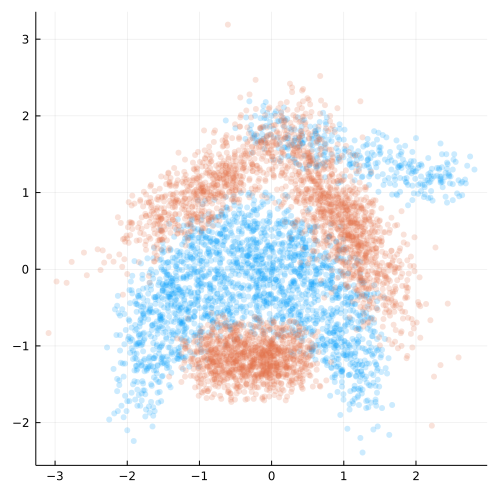

In [3]:
function plot_data(X, Y; size=(300, 500))
    return Plots.scatter(
        eachcol(X)...; group=Y, alpha=0.2, markerstrokewidth=0.0, lab="", size=size
    )
end
plot_data(X, Y; size=(500, 500))

### Run sparse classification with increasing number of inducing points

In [4]:
Ms = [4, 8, 16, 32, 64]
models = Vector{AbstractGPModel}(undef, length(Ms) + 1)
kernel = SqExponentialKernel() ∘ ScaleTransform(1.0)
for (i, num_inducing) in enumerate(Ms)
    @info "Training with $(num_inducing) points"
    m = SVGP(
        kernel,
        LogisticLikelihood(),
        AnalyticVI(),
        inducingpoints(KmeansAlg(num_inducing), X);
        optimiser=false,
        Zoptimiser=false,
    )
    @time train!(m, X_train, y_train, 20)
    models[i] = m
end

[ Info: Training with 4 points
 10.844304 seconds (19.26 M allocations: 1.108 GiB, 4.87% gc time, 99.75% compilation time)
[ Info: Training with 8 points
  0.015366 seconds (3.01 k allocations: 13.972 MiB)
[ Info: Training with 16 points
  0.025404 seconds (3.04 k allocations: 24.884 MiB)
[ Info: Training with 32 points
  0.068460 seconds (3.09 k allocations: 47.315 MiB, 41.30% gc time)
[ Info: Training with 64 points
  0.078914 seconds (3.39 k allocations: 94.619 MiB)


### Running the full model

In [5]:
@info "Running full model"
mfull = VGP(X_train, y_train, kernel, LogisticLikelihood(), AnalyticVI(); optimiser=false)
@time train!(mfull, 5)
models[end] = mfull

[ Info: Running full model
 10.489956 seconds (3.67 M allocations: 2.473 GiB, 4.89% gc time, 21.92% compilation time)


Variational Gaussian Process with a BernoulliLikelihood{GPLikelihoods.LogisticLink}(GPLikelihoods.LogisticLink(LogExpFunctions.logistic)) infered by Analytic Variational Inference 

### We create a prediction and plot function on a grid

In [6]:
function compute_grid(model, n_grid=50)
    mins = [-3.25, -2.85]
    maxs = [3.65, 3.4]
    x_lin = range(mins[1], maxs[1]; length=n_grid)
    y_lin = range(mins[2], maxs[2]; length=n_grid)
    x_grid = Iterators.product(x_lin, y_lin)
    y_grid, _ = proba_y(model, vec(collect.(x_grid)))
    return y_grid, x_lin, y_lin
end

function plot_model(model, X, Y, title=nothing; size=(300, 500))
    n_grid = 50
    y_pred, x_lin, y_lin = compute_grid(model, n_grid)
    title = if isnothing(title)
        (model isa SVGP ? "M = $(AGP.dim(model[1]))" : "full")
    else
        title
    end
    p = plot_data(X, Y; size=size)
    Plots.contour!(
        p,
        x_lin,
        y_lin,
        reshape(y_pred, n_grid, n_grid)';
        cbar=false,
        levels=[0.5],
        fill=false,
        color=:black,
        linewidth=2.0,
        title=title,
    )
    if model isa SVGP
        Plots.scatter!(
            p, eachrow(hcat(AGP.Zview(model[1])...))...; msize=2.0, color="black", lab=""
        )
    end
    return p
end;

### Now run the prediction for every model and visualize the differences

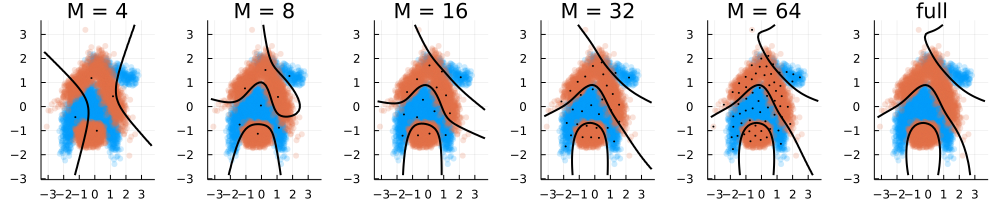

In [7]:
Plots.plot(
    plot_model.(models, Ref(X), Ref(Y))...; layout=(1, length(models)), size=(1000, 200)
)

## Bayesian SVM vs Logistic
### We now create a model with the Bayesian SVM likelihood

In [8]:
mbsvm = VGP(X_train, y_train, kernel, BayesianSVM(), AnalyticVI(); optimiser=false)
@time train!(mbsvm, 5)

  9.073490 seconds (1.41 M allocations: 2.340 GiB, 4.84% gc time, 10.47% compilation time)


(Variational Gaussian Process with a BernoulliLikelihood{AugmentedGaussianProcesses.SVMLink}(AugmentedGaussianProcesses.SVMLink()) infered by Analytic Variational Inference , (local_vars = (c = [0.19066459123793808, 0.2316454066533993, 0.0031544471158863247, 0.13783608431929248, 0.23493768647556923, 4.754524325433761, 1.6762565726960272, 1.4822238505113354, 0.45473690730484545, 0.07199295745870501  …  0.3674542315138281, 0.46906021066906367, 0.10311036630751802, 0.820139046182534, 3.2678129506899065, 0.6793569622948201, 5.001778909691415, 0.4947182427870569, 1.2812846432152984, 2.9561752313139205], θ = [2.29015552640959, 2.077725421646932, 17.80485226800952, 2.6935096539564287, 2.0631160426355173, 0.4586131076254875, 0.7723777475453046, 0.8213780661294696, 1.482927428694241, 3.726962239772856  …  1.6496749262220423, 1.4601104286319262, 3.1142167420131313, 1.1042216441045376, 0.5531862862463869, 1.2132519128677302, 0.44713406146199275, 1.42174279924846, 0.8834402651824085, 0.58161408196

### And compare it with the Logistic likelihood

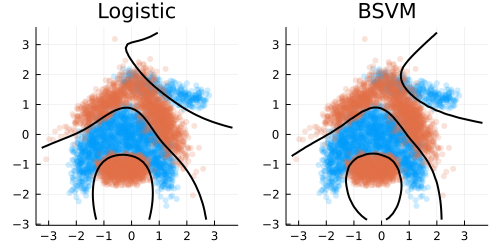

In [9]:
Plots.plot(
    plot_model.(
        [models[end], mbsvm], Ref(X), Ref(Y), ["Logistic", "BSVM"]; size=(500, 250)
    )...;
    layout=(1, 2),
)

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*